# Perception and Action Course Project

In [1]:
# imports
from enum import Enum, auto
from typing import Optional
import warnings

from graphviz import Digraph
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import arviz as az
import pymc as pm

SEED = np.random.seed(42)
sns.set_theme()
warnings.simplefilter('ignore')

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
# prepare data
df = pd.read_csv('./ploscompbio_pucks/data/puck_data.csv', sep='\t', encoding='utf8')
df['Press Rolling Average'] = df['PressTime'].rolling(7).mean()
df['Distance Rolling Average'] = df['DistToTarget'].rolling(7).mean()

# for further processing put dataframes based on their condition and phase into separate frames
mapping = {
    'Condition': {
        1: 'Light-to-heavy',
        2: 'Heavy-to-light'
    },
    'Phase': {
        1: 'Prior',
        2: 'Feedback',
        3: 'No Feedback',
        4: 'Collisions and No Feedback' 
    }
}

# remap values
df = df.replace(mapping)

df.describe()

,Trial,StartPosition,EndPosition,DistToTarget,DistMoved,PressTime,AbsError,Error,Mass,Press Rolling Average,Distance Rolling Average
count,7200.000000,7200.000000,6400.000000,7200.000000,6400.000000,7200.000000,6400.000000,6400.000000,6400.000000,7194.000000,7194.000000
mean,69.944444,1.997479,5.495392,3.002521,3.500862,0.965139,1.588654,0.495392,2.000000,0.964894,3.002230
std,51.747055,1.156613,2.908972,1.156613,3.249942,0.438878,2.486635,2.908972,0.433047,0.306821,0.429457
min,1.000000,0.000538,0.255766,1.000091,0.019565,0.040000,0.000502,-4.744234,1.500000,0.091429,1.607305
25%,29.000000,0.982081,4.104473,1.995347,1.497057,0.660000,0.420114,-0.895527,1.500000,0.785714,2.700583
50%,59.000000,1.995608,4.853666,3.004392,2.745664,0.900000,0.922895,-0.146334,2.000000,0.934285,2.997476
75%,96.000000,3.004653,5.976427,4.017919,4.426841,1.219999,1.820752,0.976427,2.500000,1.117142,3.294928
max,200.000000,3.999909,61.745759,4.999462,60.382678,3.439997,56.745759,56.745759,2.500000,2.317141,4.471749


## Descriptive Statistics and Plots

In [3]:
def newtonian_relationship(
    distance_to_target: np.ndarray,
    mass: float,
    gravitational_acceleration: float = 9.80665,
    surface_friction: float = 4e-2,
) -> np.ndarray:
    """A vectorized function of the optimal newtonian relationship
    T_{press} = \sqrt{\frac{2\mu gm^2}{F^2}\delta x} \propto m \cdot \sqrt{\delta x}

    Args:
        distance_to_target (np.ndarray): distances to apply function on
        mass (float): the mass of the object
        gravitational_acceleration (float): newton's constant
        surface_friction (float): friction of the surface

    Returns:
        np.ndarray: optimal newton estimate for the tpress
    """
    # for model difference it does not make any difference at all / propto already implemented
    def fn(distance):
        f1 = 2. * surface_friction * gravitational_acceleration * mass**2
        tpress = np.sqrt((f1 / (3 ** 2)) * distance)
        return tpress

    return np.vectorize(fn)(distance_to_target)

# prepare plotting dataframes
light_to_heavy = df[df['Condition'] == 'Light-to-heavy']
light_to_heavy.loc[(light_to_heavy['Mass'] == 1.5), 'Phase'] = 'Feedback 1.5'
light_to_heavy.loc[(light_to_heavy['Mass'] == 2.0), 'Phase'] = 'Feedback 2.0'
# light_to_heavy['Press Rolling Average'] = light_to_heavy['PressTime'].rolling(10).mean()
# light_to_heavy['Dist Rolling Average'] = light_to_heavy['DistToTarget'].rolling(10).mean()
l2h_order = ['Prior', 'Feedback 1.5', 'Feedback 2.0', 'No Feedback', 'Collisions and No Feedback']

heavy_to_light = df[df['Condition'] != 'Light-to-heavy']
heavy_to_light.loc[(heavy_to_light['Mass'] == 2.5), 'Phase'] = 'Feedback 2.5'
heavy_to_light.loc[(heavy_to_light['Mass'] == 2.0), 'Phase'] = 'Feedback 2.0'
# heavy_to_light['Press Rolling Average'] = heavy_to_light['PressTime'].rolling(10).mean()
# heavy_to_light['Dist Rolling Average'] = heavy_to_light['DistToTarget'].rolling(10).mean()
h2l_order = ['Prior', 'Feedback 2.5', 'Feedback 2.0', 'No Feedback', 'Collisions and No Feedback']

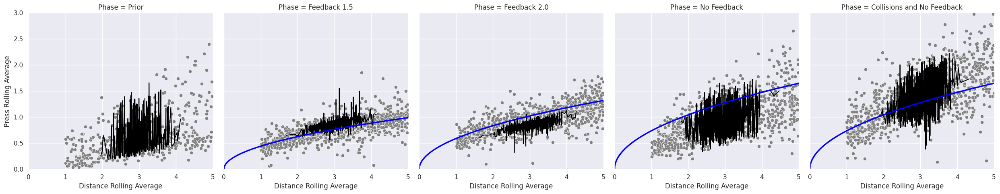

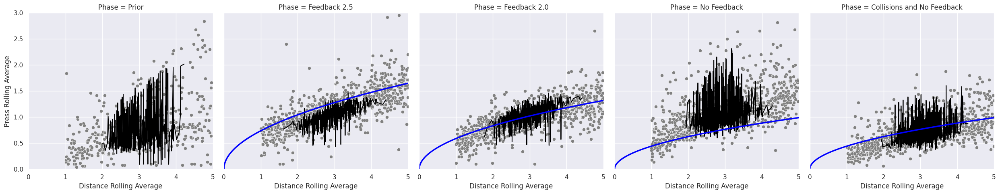

In [4]:
def plot_fig2(df: pd.DataFrame, order: list[str]) -> plt.Figure:
    fig = sns.FacetGrid(df, col='Phase', height=5, xlim=[0, 5], ylim=[0, 3], col_order=order)
    fig.map(sns.scatterplot, 'DistToTarget', 'PressTime', color='gray')
    fig.map(sns.lineplot, 'Distance Rolling Average', 'Press Rolling Average', color='black')
    for col, ax in zip(order, fig.fig.axes):
        tmp = df[df['Phase'] == col]
        mass = tmp['Mass'].unique()[0]
        linspace = np.linspace(0.0, 5.0, num=len(tmp))
        newtonian = newtonian_relationship(linspace, mass)
        # ax.plot(tmp[''], tmp['Press Rolling Average'], color='black')
        if col == 'Prior': continue
        ax.plot(linspace, newtonian, linewidth=2.5, color='blue')

plot_fig2(light_to_heavy, l2h_order)
plot_fig2(heavy_to_light, h2l_order)

In [5]:
# analyzing target participant data
TARGET_PARTICIPANT='PF23EN'
data = df[df['Subject'] == TARGET_PARTICIPANT]
phases = {phase: data[data['Phase'] == phase] for phase in data['Phase'].unique()}
max_len = max([len(v) for v in phases.values()])
paddings = {phase: np.array((max_len - len(data)) * [np.nan]) for phase, data in phases.items()}

distances = []
press_times = []

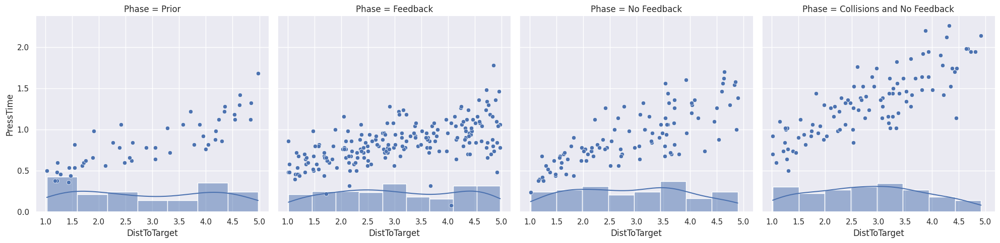

In [6]:
# participant distributions over press time and distance to target
grid = sns.FacetGrid(data, col='Phase', height=5, col_order=['Prior', 'Feedback', 'No Feedback', 'Collisions and No Feedback'])
grid.map(sns.histplot, 'DistToTarget', kde=True, stat='density')
grid.map(sns.scatterplot, 'DistToTarget', 'PressTime')
# sns.pairplot(data)

In [7]:
class NewtonianRelationship(Enum):
    """Potential Newtonian relationships to be modeled"""
    optimal = auto()
    linear = auto()
    square_root = auto()

class NewtonianInteractionModel:
    def __init__(self, 
                 observed_distances: np.ndarray,
                 observed_press_times: np.ndarray,
                 relationship: Optional[NewtonianRelationship] = NewtonianRelationship.square_root
                 ):
        self.model = pm.Model('Newtonian')
        self.observed_distances = observed_distances
        self.observed_press_times = observed_press_times
        self.relationship = relationship

        self.inference_data = None
        self.prior_predictive = None
        self.posterior_predictive = None

    def build_model(self) -> Digraph:
        with self.model:
            x_ij = pm.Uniform('x', np.amin(self.observed_distances), np.amax(self.observed_distances), observed=self.observed_distances)

            perceived_distance = pm.LogNormal(
                'perceptual uncertainties',
                mu=x_ij,
                sigma=0.05,
            )

            if not self.relationship == NewtonianRelationship.linear:
                puck_mass = pm.Gamma('mass', 6, 2.5)
            
            if self.relationship == NewtonianRelationship.square_root:
                newtonian = pm.Deterministic('t', puck_mass * np.sqrt(perceived_distance))
            elif self.relationship == NewtonianRelationship.optimal:
                newtonian = pm.Deterministic('t', newtonian_relationship(perceived_distance, puck_mass))
            elif self.relationship == NewtonianRelationship.linear:
                # learning a linear model as mentioned in the forum
                lin_sigma = pm.HalfCauchy('lin_sigma', beta=10)
                intercept = pm.Normal('intercept', 0, sigma=20)
                slope = pm.Normal('slope', 0, sigma=20)
                newtonian = pm.Normal('y', mu=intercept + slope * perceived_distance, sigma=lin_sigma)

            sigma_t = pm.Gamma('sigma^t', 1.2, 5)
            observed_press_time = pm.LogNormal('t_est',
                                            newtonian,
                                            sigma_t,
                                            observed=self.observed_press_times)

        return pm.model_to_graphviz(self.model)

    
    def sample(self,
               **kwargs,
    ) -> tuple[az.InferenceData, az.InferenceData, az.InferenceData]:

        with self.model:
            # defaults to NUTS sampler
            step = pm.NUTS(target_accept=.9)
            idata = pm.sample(draws=10000, step=step)
            prior_predictive = pm.sample_prior_predictive(samples=1000, random_seed=SEED)
            posterior_predictive = pm.sample_posterior_predictive(idata, extend_inferencedata=True, random_seed=SEED)
            pm.compute_log_likelihood(idata)

            self.inference_data = idata
            self.prior_predictive = prior_predictive
            self.posterior_predictive = posterior_predictive

        return idata, prior_predictive, posterior_predictive

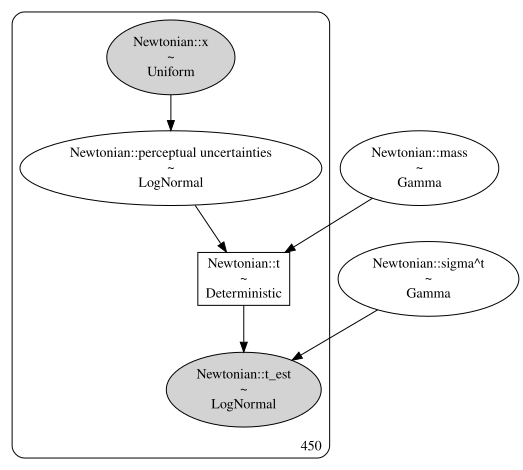

In [8]:
newtonian_model = NewtonianInteractionModel(data['DistToTarget'], data['PressTime'])
newtonian_model.build_model()

In [9]:
idata, prior_predictive, posterior_predictive = newtonian_model.sample()

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Newtonian::perceptual uncertainties, Newtonian::mass, Newtonian::sigma^t]
NUTS: [Newtonian::perceptual uncertainties, Newtonian::mass, Newtonian::sigma^t]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 23 seconds.
Chain <xarray.DataArray 'chain' ()>
array(0)
Coordinates:
    chain    int64 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(1)
Coordinates:
    chain    int64 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(2)
Coordinates:
    chain    int64 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(3)
Coordinates:
    chain    int64 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Sampling: [Newtonian::mass, Newtonian::perceptual uncertainties, Newtonian::sigma^t, Newtonian::t_est, Newtonian::x]


array([[<Axes: title={'center': 'Newtonian::perceptual uncertainties'}>,
        <Axes: title={'center': 'Newtonian::perceptual uncertainties'}>],
       [<Axes: title={'center': 'Newtonian::mass'}>,
        <Axes: title={'center': 'Newtonian::mass'}>],
       [<Axes: title={'center': 'Newtonian::sigma^t'}>,
        <Axes: title={'center': 'Newtonian::sigma^t'}>],
       [<Axes: title={'center': 'Newtonian::t'}>,
        <Axes: title={'center': 'Newtonian::t'}>]], dtype=object)

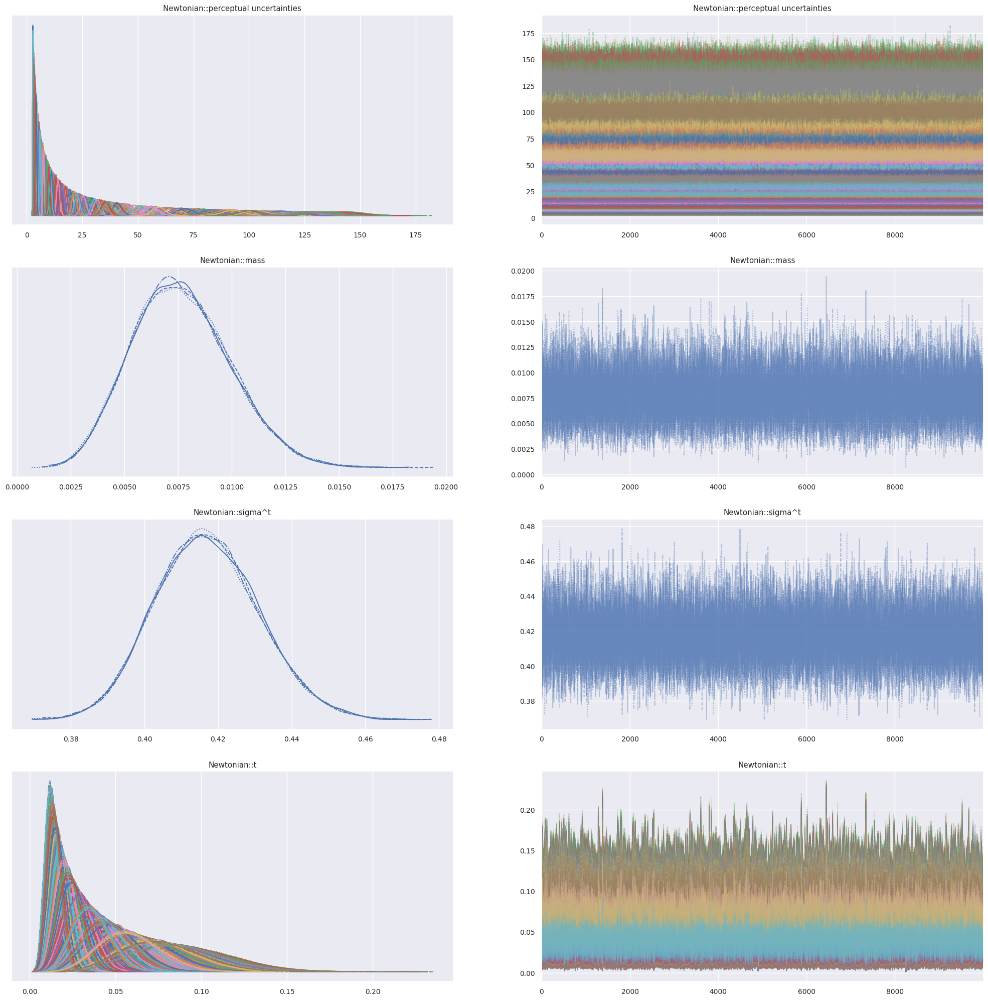

In [10]:
az.plot_trace(idata, figsize=(25, 25))

array([<Axes: xlabel='Newtonian::x / Newtonian::x'>,
       <Axes: xlabel='Newtonian::t_est / Newtonian::t_est'>], dtype=object)

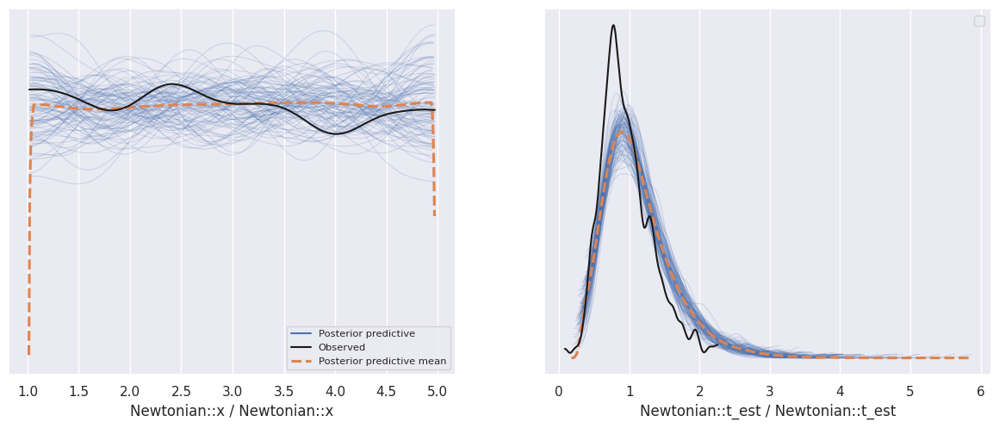

In [11]:
az.plot_ppc(idata, num_pp_samples=100)

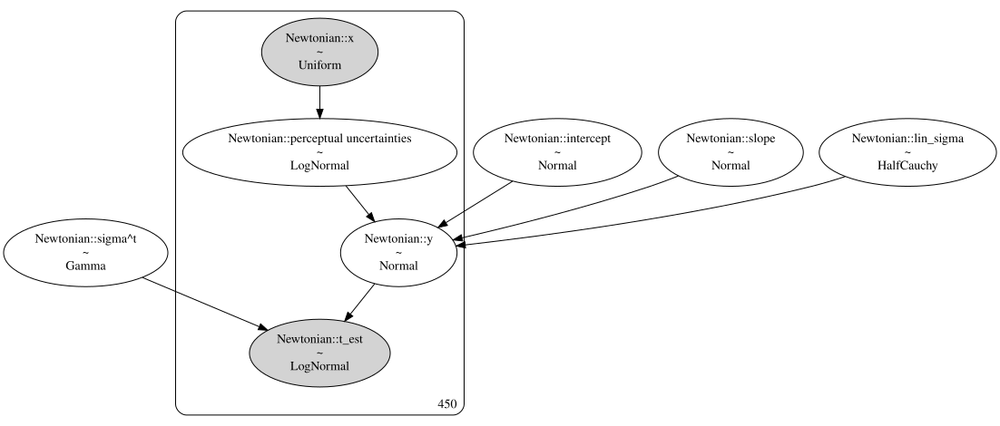

In [12]:
linear_model = NewtonianInteractionModel(data['DistToTarget'], data['PressTime'], NewtonianRelationship.linear)
linear_model.build_model()

In [13]:
linear_idata, linear_prior_predictive, linear_posterior_predictive = linear_model.sample()

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Newtonian::perceptual uncertainties, Newtonian::lin_sigma, Newtonian::intercept, Newtonian::slope, Newtonian::y, Newtonian::sigma^t]
NUTS: [Newtonian::perceptual uncertainties, Newtonian::lin_sigma, Newtonian::intercept, Newtonian::slope, Newtonian::y, Newtonian::sigma^t]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 159 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 75 divergences after tuning. Increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(0)
Coordinates:
    chain    int64 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(1)
Coordinates:
    chain    int64 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain <xarray.DataArray 'chain' ()>
array(2)
Coordinates:
    chain    int64 2 reached the maximum tree d

array([[<Axes: title={'center': 'Newtonian::intercept'}>,
        <Axes: title={'center': 'Newtonian::intercept'}>],
       [<Axes: title={'center': 'Newtonian::slope'}>,
        <Axes: title={'center': 'Newtonian::slope'}>],
       [<Axes: title={'center': 'Newtonian::y'}>,
        <Axes: title={'center': 'Newtonian::y'}>],
       [<Axes: title={'center': 'Newtonian::perceptual uncertainties'}>,
        <Axes: title={'center': 'Newtonian::perceptual uncertainties'}>],
       [<Axes: title={'center': 'Newtonian::lin_sigma'}>,
        <Axes: title={'center': 'Newtonian::lin_sigma'}>],
       [<Axes: title={'center': 'Newtonian::sigma^t'}>,
        <Axes: title={'center': 'Newtonian::sigma^t'}>]], dtype=object)

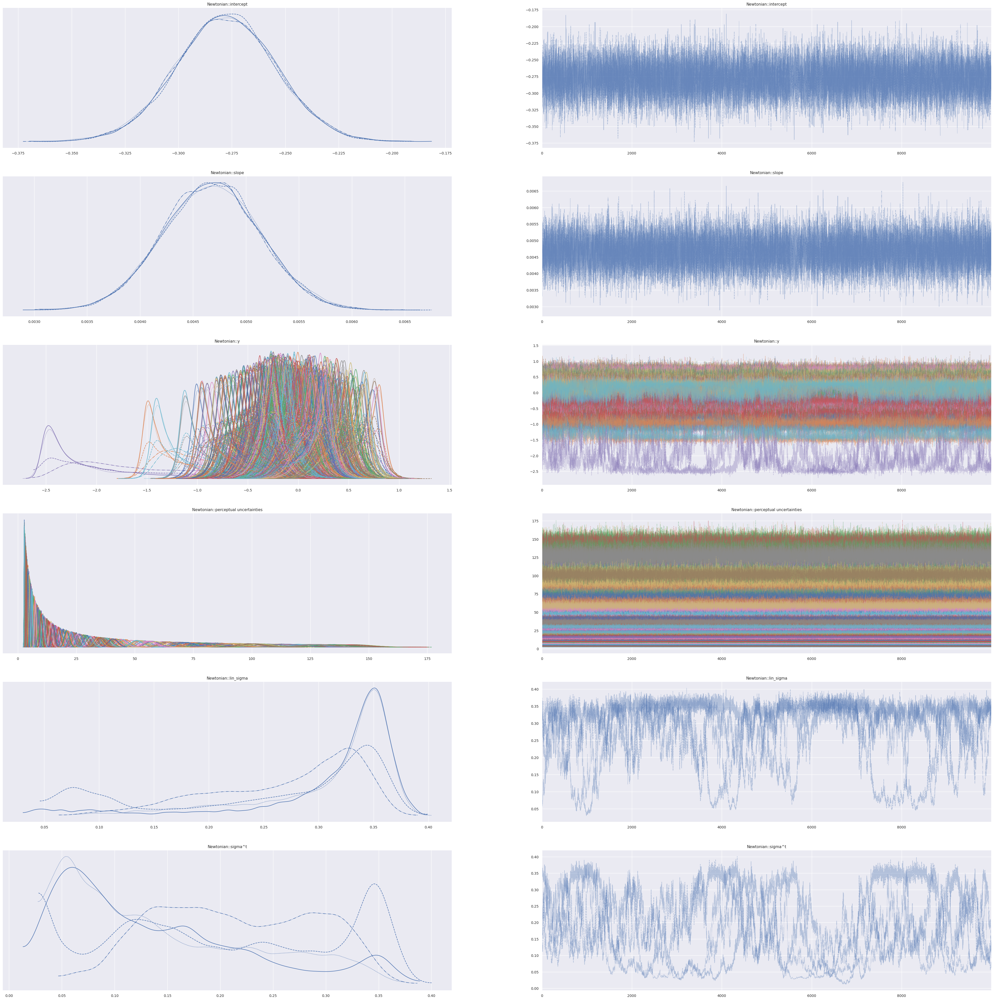

In [14]:
az.plot_trace(linear_idata, divergences=None, figsize=(50, 50))

array([<Axes: xlabel='Newtonian::x / Newtonian::x'>,
       <Axes: xlabel='Newtonian::t_est / Newtonian::t_est'>], dtype=object)

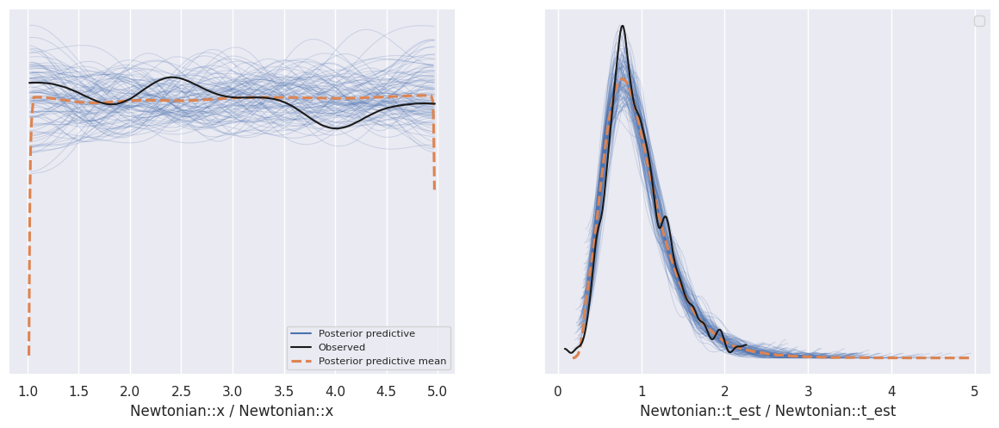

In [15]:
az.plot_ppc(linear_idata, num_pp_samples=100)

In [16]:
compare_df = az.compare({'squared': idata, 'linear': linear_idata}, var_name='Newtonian::t_est')
compare_df

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
linear,0,-1.017052,477.797165,0.000000,1.0,25.303690,0.000000,True,log
squared,1,-194.961497,2.894691,193.944444,0.0,21.262694,10.625807,False,log


<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

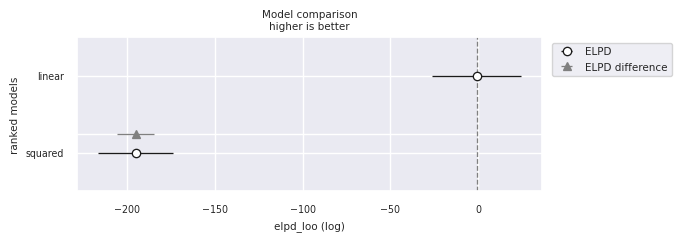

In [17]:
az.plot_compare(compare_df)